# 1. Defining Paths

In [2]:
from pathlib import Path
import os
import sys
sys.path.append(str(Path(os.getcwd()).resolve().parent))

PROJECT_PATH = Path(os.getcwd()).resolve().parent
DATA_DIR = PROJECT_PATH / 'data'
CAPUCHINBIRD_DIR = DATA_DIR / 'Parsed_Capuchinbird_Clips'
NOT_CAPUCHINBIRD_DIR = DATA_DIR / 'Parsed_Not_Capuchinbird_Clips'

# 2. Loading DataFrames

In [3]:
from scripts.data_loading import load_audio_filepaths

CAPUCHINBIRD_DF = load_audio_filepaths(CAPUCHINBIRD_DIR)
NOT_CAPUCHINBIRD_DF = load_audio_filepaths(NOT_CAPUCHINBIRD_DIR)

In [4]:
CAPUCHINBIRD_DF

,filename,filepath
0,XC114131-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
1,XC114131-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
2,XC114131-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
3,XC114131-3.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
4,XC114131-4.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
...,...,...
212,XC9221-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
213,XC9221-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
214,XC98557-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...
215,XC98557-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...


# 3. Checking balance between Capuchinbird and Not Capuchinbrid Datasets

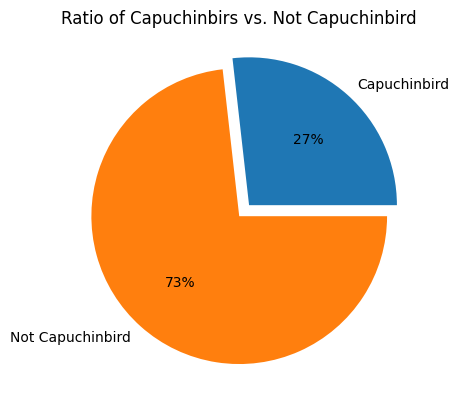

In [5]:
import matplotlib.pyplot as plt

plt.pie(
    (len(CAPUCHINBIRD_DF), len(NOT_CAPUCHINBIRD_DF)),
    labels=['Capuchinbird', 'Not Capuchinbird'],
    autopct='%0.f%%',
    explode=(0.1, 0)
)

plt.title('Ratio of Capuchinbirs vs. Not Capuchinbird')
plt.show()

# 4. Plot One Sample from Capuchinbirg and Not Capuchinbird

## 4.1 Loading Audio Function

In [6]:
import librosa
import numpy as np

def load_wav_24k_mono(filepath: str) -> np.ndarray:
    wav, sr = librosa.load(filepath, sr=24000, mono=True)

    return wav

## 4.2 Selecting Samples

In [7]:
cap_file = CAPUCHINBIRD_DF.iloc[10]['filepath']
n_cap_file = NOT_CAPUCHINBIRD_DF.iloc[10]['filepath']

In [8]:
from IPython.display import Audio

print('CAPUCHINBIRD')
Audio(cap_file)

CAPUCHINBIRD


In [9]:
print('Not Capuchinbird')
Audio(n_cap_file)

Not Capuchinbird


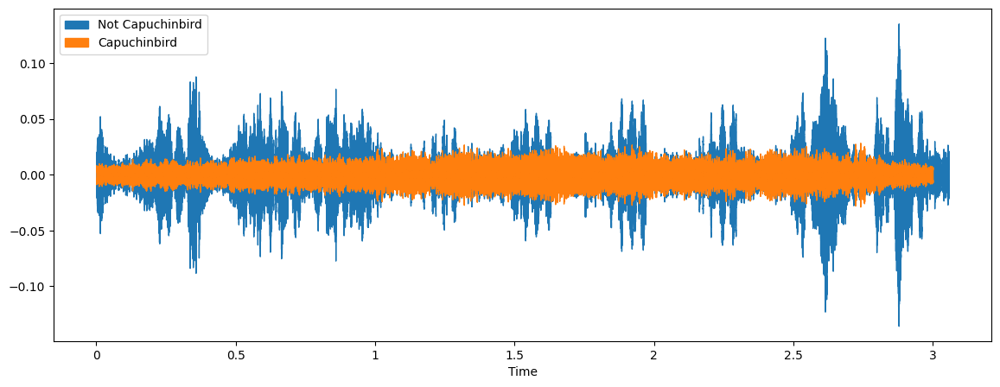

In [10]:
cap_wav = load_wav_24k_mono(cap_file)
n_cap_wav = load_wav_24k_mono(n_cap_file)

plt.figure(figsize=(14, 5))
librosa.display.waveshow(n_cap_wav, sr=24e3, label='Not Capuchinbird')
librosa.display.waveshow(cap_wav, sr=24e3, label='Capuchinbird')
plt.legend()
plt.show()

# 5. Determine Average Length of a Capuchin Call

## 5.1 Calculating Average Wave Cycle Length

In [11]:
def cycle_length(filepath: str) -> int:
    wav = load_wav_24k_mono(filepath)

    return wav.shape[0]

In [12]:
CAPUCHINBIRD_DF['n_samples'] = CAPUCHINBIRD_DF['filepath'].apply(cycle_length)
CAPUCHINBIRD_DF

,filename,filepath,n_samples
0,XC114131-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,60000
1,XC114131-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,72000
2,XC114131-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84000
3,XC114131-3.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,72000
4,XC114131-4.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84000
...,...,...,...
212,XC9221-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001
213,XC9221-2.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,84001
214,XC98557-0.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001
215,XC98557-1.wav,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,96001


In [13]:
CAPUCHINBIRD_DF['n_samples'].describe()

count       217.000000
mean      81235.414747
std       12287.795046
min       48000.000000
25%       72000.000000
50%       84000.000000
75%       84001.000000
max      120001.000000
Name: n_samples, dtype: float64

In [14]:
N_SAMPLES = 72000

def fix_audio_length(wav: np.ndarray) -> np.ndarray:
    wav = wav[:N_SAMPLES]
    zero_padding = np.zeros(N_SAMPLES - wav.shape[0], dtype=np.float32)
    wav = np.concatenate((wav, zero_padding))

    return wav

# 6. Visualize Spectograms

In [15]:
def get_spectogram(wav: np.ndarray, expand_dims: bool=False) -> np.ndarray:
    spectogram = librosa.stft(wav, n_fft=512, hop_length=128)
    if expand_dims:
        spectogram = np.expand_dims(spectogram, axis=2)
    
    return spectogram

In [16]:
random_idx = np.random.choice(CAPUCHINBIRD_DF.index, 6, replace=False)
capuchin_10_samples = CAPUCHINBIRD_DF.iloc[random_idx]
random_idx = np.random.choice(NOT_CAPUCHINBIRD_DF.index, 6, replace=False)
not_capuchin_10_samples = NOT_CAPUCHINBIRD_DF.iloc[random_idx]

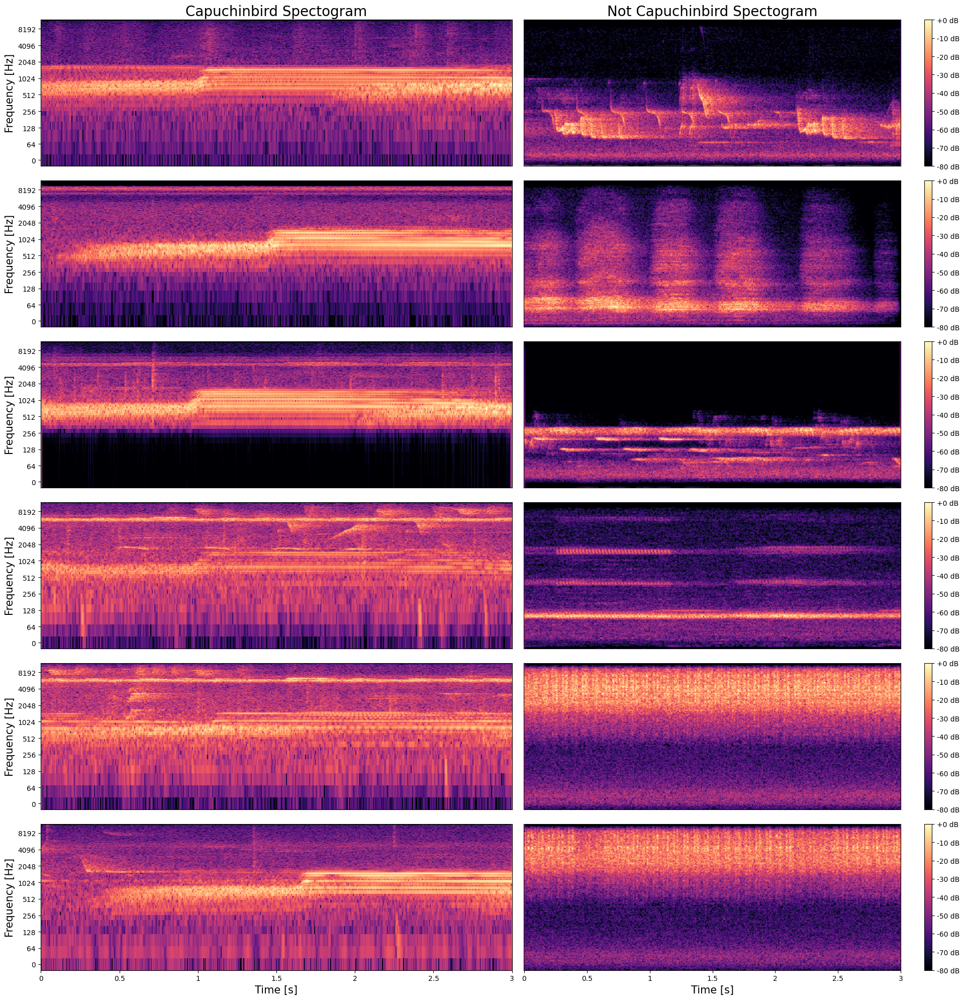

In [17]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    spec_cap = np.abs(get_spectogram(wav_cap))
    spec_not = np.abs(get_spectogram(wav_not))

    spec_cap_db = librosa.amplitude_to_db(spec_cap, ref=np.max)
    spec_not_db = librosa.amplitude_to_db(spec_not, ref=np.max)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=spec_cap_db, sr=24000, y_axis='log', hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=spec_not_db, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Frequency [Hz]', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird Spectogram', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird Spectogram', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=spec_cap_db, y_axis='log', x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=spec_not_db, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Frequency [Hz]', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 7. Visualize Mel-Spectograms

In [18]:
def get_mel_spectogram(wav: np.ndarray, expand_dims: bool=False) -> np.ndarray:
    mel_spectogram = librosa.feature.melspectrogram(y=wav, sr=24000, n_fft=512, hop_length=128, n_mels=128)
    if expand_dims:
        mel_spectogram = np.expand_dims(mel_spectogram, axis=2)
    
    return mel_spectogram

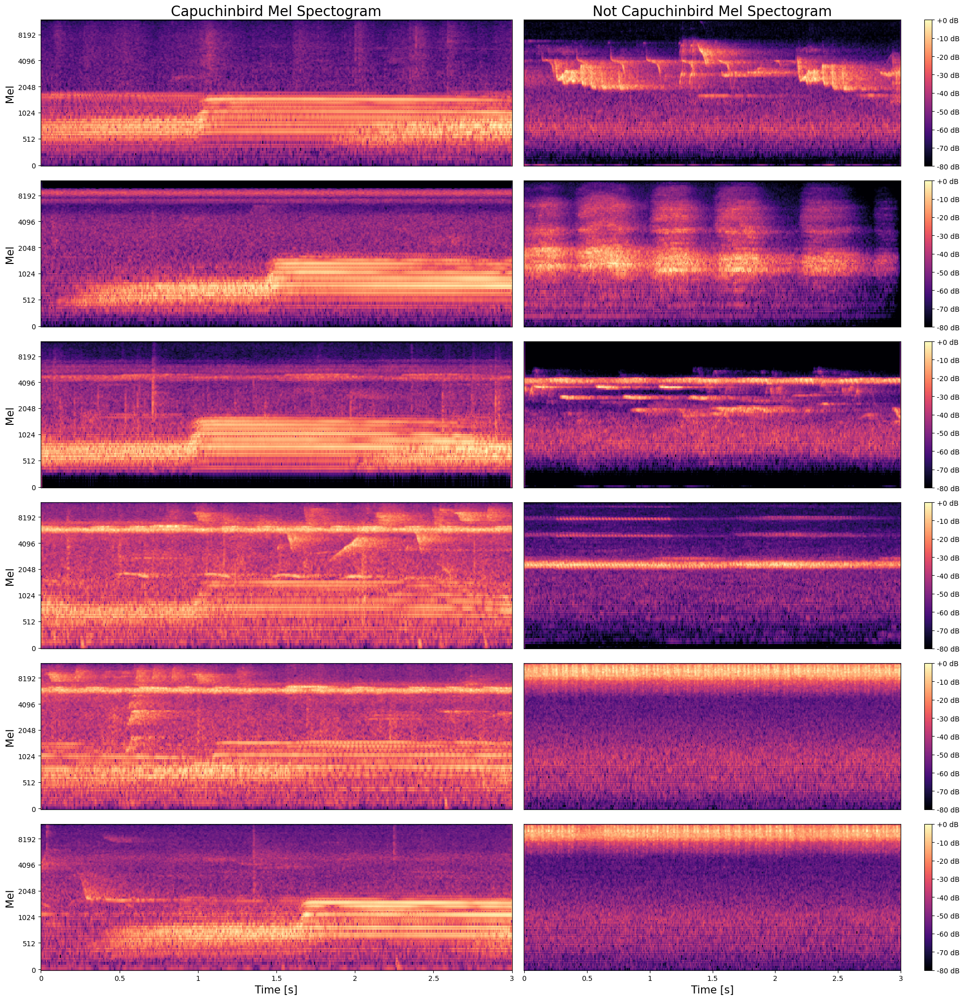

In [19]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    mel_spec_cap = get_mel_spectogram(wav_cap)
    mel_spec_not = get_mel_spectogram(wav_not)

    mel_spec_cap_db = librosa.power_to_db(mel_spec_cap, ref=np.max)
    mel_spec_not_db = librosa.power_to_db(mel_spec_not, ref=np.max)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=mel_spec_cap_db, sr=24000, y_axis='mel', hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=mel_spec_not_db, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Mel', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird Mel Spectogram', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird Mel Spectogram', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=mel_spec_cap_db, y_axis='mel', x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=mel_spec_not_db, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, format='%+2.0f dB', ax=axes[idx_not])
        axes[idx_cap].set_ylabel('Mel', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 8. Visualize MFCC

In [20]:
def get_MFCC(wav: np.ndarray, n_mfcc: int, expand_dims: bool=False) -> np.ndarray:
    mfcc = librosa.feature.mfcc(y=wav, sr=24000, n_fft=512, hop_length=128, n_mfcc=n_mfcc)
    if expand_dims:
        mfcc = np.expand_dims(mfcc, axis=2)
    
    return mfcc

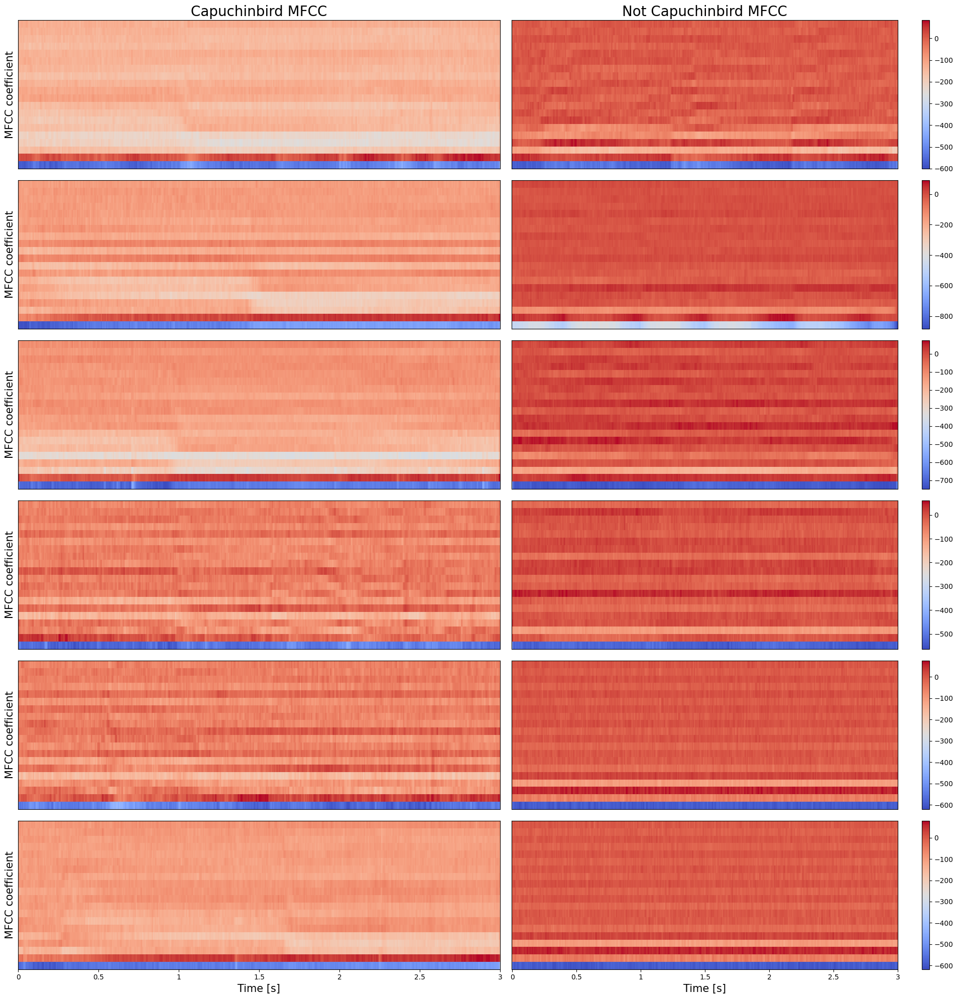

In [21]:
nrows = 6
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for idx, (capuchin_filepath, not_capuchin_filepath) in enumerate(zip(capuchin_10_samples['filepath'], not_capuchin_10_samples['filepath'])):
    wav_cap = load_wav_24k_mono(capuchin_filepath)
    wav_not = load_wav_24k_mono(not_capuchin_filepath)

    wav_cap = fix_audio_length(wav_cap)
    wav_not = fix_audio_length(wav_not)

    MFCC_cap = get_MFCC(wav_cap, n_mfcc=20)
    MFCC_not = get_MFCC(wav_not, n_mfcc=20)

    idx_cap = 2 * idx
    idx_not = (2 * idx) + 1

    if idx != nrows-1:
        librosa.display.specshow(data=MFCC_cap, sr=24000, y_axis=None, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=MFCC_not, sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, ax=axes[idx_not])
        axes[idx_cap].set_ylabel('MFCC coefficient', fontsize=15)

    if idx == 0:
        axes[idx_cap].set_title('Capuchinbird MFCC', fontsize=20)
        axes[idx_not].set_title('Not Capuchinbird MFCC', fontsize=20)

    if idx == nrows-1:
        librosa.display.specshow(data=MFCC_cap, y_axis=None, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_cap])
        img = librosa.display.specshow(data=MFCC_not, x_axis='time', sr=24000, hop_length=128, ax=axes[idx_not])

        plt.colorbar(img, ax=axes[idx_not])
        axes[idx_cap].set_ylabel('MFCC coefficient', fontsize=15)

        axes[idx_cap].set_xlabel('Time [s]', fontsize=15)
        axes[idx_not].set_xlabel('Time [s]', fontsize=15)


plt.tight_layout()
plt.show()

# 9. Merging Datasets and adding Labels

In [22]:
import pandas as pd

data = pd.concat(
    (
        CAPUCHINBIRD_DF.assign(label=1), 
        NOT_CAPUCHINBIRD_DF.assign(label=0)
    ), 
    axis=0
)[['filepath', 'label']]

In [23]:
data

,filepath,label
0,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
1,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
2,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
3,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
4,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,1
...,...,...
588,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
589,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
590,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0
591,C:\Users\miki0\Desktop\Projects\Audio\Capuchin...,0


# 10. Preparing Data for ML Models

## 10.1 Extracting Standard Deviation (std) and Mean for each Mel

In [24]:
def MFCC_mean_std(mfcc):
    mfcc_mean = mfcc.mean(axis=1)
    mfcc_std = mfcc.std(axis=1)
    feature_vector = np.concatenate([mfcc_mean, mfcc_std])

    return feature_vector

In [25]:
mfcc_features = []
N_MFCC = 20

for filepath in data['filepath']:
    wav = load_wav_24k_mono(filepath)
    wav = fix_audio_length(wav)
    mfcc = get_MFCC(wav, n_mfcc=N_MFCC)
    feature_vector = MFCC_mean_std(mfcc)
    mfcc_features.append(feature_vector)

mfcc_features = np.array(mfcc_features)
mfcc_features.shape


(810, 40)

In [26]:
feature_names = [f'mfcc_{n+1}_mean' for n in range(N_MFCC)] + [f'mfcc_{n+1}_std' for n in range(N_MFCC)]

df_features = pd.concat(
    (
        pd.DataFrame(mfcc_features, columns=feature_names),
        data['label'].reset_index(drop=True)
    ),
    axis=1
)
df_features

,mfcc_1_mean,mfcc_2_mean,mfcc_3_mean,mfcc_4_mean,mfcc_5_mean,mfcc_6_mean,mfcc_7_mean,mfcc_8_mean,mfcc_9_mean,mfcc_10_mean,...,mfcc_12_std,mfcc_13_std,mfcc_14_std,mfcc_15_std,mfcc_16_std,mfcc_17_std,mfcc_18_std,mfcc_19_std,mfcc_20_std,label
0,-606.744385,64.156319,0.616126,-29.570839,-69.557869,20.485350,-11.222611,-9.279613,8.124854,4.578422,...,9.057345,7.974447,9.712642,6.227230,6.865395,5.995736,9.532133,8.937919,6.409004,1
1,-532.005310,70.882698,0.676590,-34.821465,-84.786514,27.581680,-7.783874,-4.975824,16.344276,5.709740,...,7.873626,7.604167,8.232334,6.193562,7.594326,6.837880,6.583007,7.026431,6.654953,1
2,-538.898987,66.199310,5.687092,-24.744280,-75.520172,19.895966,-18.913483,-9.552833,8.509912,4.928029,...,8.080588,8.603658,8.841310,6.917812,8.612975,7.987647,7.479937,8.404984,6.331627,1
3,-533.652161,63.924229,-5.916528,-27.779629,-75.414024,22.504999,-12.269957,-7.911198,15.199009,7.725718,...,7.250030,8.363427,7.935119,7.928361,8.312006,7.640768,6.538879,9.528507,5.743876,1
4,-544.055725,64.157524,-3.954026,-22.826408,-72.264740,19.644527,-10.636079,-16.959530,19.148615,12.448587,...,7.436962,10.110715,8.294903,7.065190,9.732930,7.887137,6.715928,7.163429,6.465579,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,-552.739014,94.244217,6.407949,-40.441750,-44.119221,-32.080196,-14.314820,-1.995832,-3.553714,-6.444102,...,8.385654,19.758728,13.873455,10.775575,7.573173,6.122296,7.803608,10.121932,10.159286,0
806,-523.200378,97.835159,-11.307199,-51.912376,-43.392372,-26.376532,-5.485725,3.997742,-3.351740,-7.580984,...,13.086874,17.420731,8.626588,12.163469,7.171203,6.673469,9.072167,8.252129,14.194366,0
807,-532.241516,105.430107,-7.140385,-58.960751,-50.850361,-30.547222,-12.229996,-0.506433,-1.050295,-1.459418,...,8.490207,20.854925,14.795438,11.496551,8.526041,5.482925,8.877973,10.682450,10.332726,0
808,-604.894531,136.930847,-22.233337,-43.130596,-35.883175,-25.101929,-14.994522,-8.345757,-13.839084,-12.800136,...,7.884962,7.135747,6.622206,6.792380,7.749235,6.820463,6.667698,7.501879,6.786647,0


## 10.2 Matrix Coefficients Heatmap

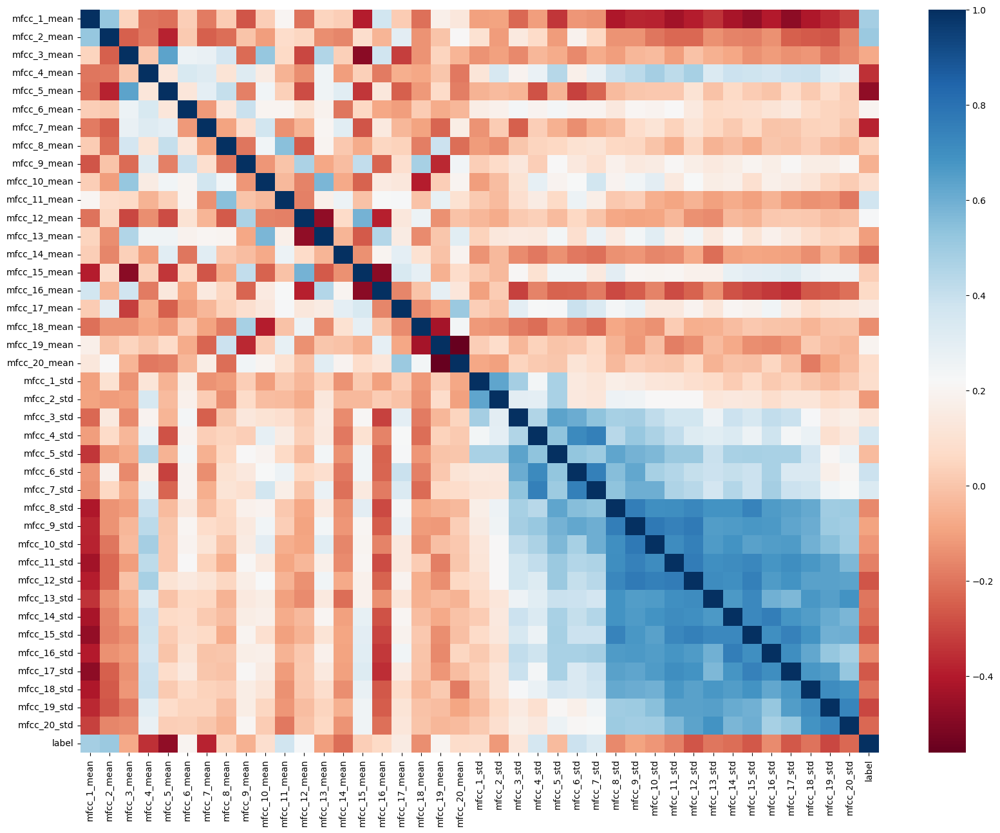

In [27]:
import seaborn as sns

m_coeff = df_features.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(m_coeff, cmap='RdBu', vmin=m_coeff.describe().loc['min'].min(), vmax=m_coeff.describe().loc['max'].max())

plt.show()

In [28]:
m_coeff_sort = m_coeff['label'].abs().sort_values(ascending=False)
m_coeff_sort

label           1.000000
mfcc_2_mean     0.507619
mfcc_1_mean     0.485925
mfcc_5_mean     0.470983
mfcc_6_std      0.388275
mfcc_7_mean     0.381889
mfcc_11_mean    0.374014
mfcc_4_std      0.354495
mfcc_4_mean     0.352280
mfcc_7_std      0.331834
mfcc_19_std     0.300606
mfcc_12_std     0.271354
mfcc_15_std     0.267959
mfcc_17_std     0.266894
mfcc_20_std     0.230760
mfcc_12_mean    0.227014
mfcc_14_std     0.217261
mfcc_14_mean    0.216981
mfcc_18_std     0.206401
mfcc_19_mean    0.200816
mfcc_13_std     0.199485
mfcc_6_mean     0.199344
mfcc_11_std     0.173239
mfcc_8_std      0.155509
mfcc_17_mean    0.152829
mfcc_16_std     0.147321
mfcc_18_mean    0.142100
mfcc_3_std      0.125576
mfcc_10_std     0.121977
mfcc_2_std      0.117683
mfcc_13_mean    0.104758
mfcc_9_std      0.096935
mfcc_10_mean    0.086139
mfcc_1_std      0.081636
mfcc_20_mean    0.079179
mfcc_3_mean     0.075086
mfcc_16_mean    0.063890
mfcc_9_mean     0.055970
mfcc_8_mean     0.047319
mfcc_5_std      0.027230


## 10.3 Selecting 10, 20 and 30 Features with Highest Coefficient Values and Test on Basic Models

In [29]:
highest_10_features = m_coeff_sort.head(11).index
highest_20_features = m_coeff_sort.head(21).index
highest_30_features = m_coeff_sort.head(31).index
highest_10_features

Index(['label', 'mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std'],
      dtype='object')

### 10.4 Splitting Data into Train and Test Sets Function

In [30]:
from sklearn.model_selection import train_test_split
from typing import Tuple

def split_data(data_frame: pd.DataFrame, feature_names: pd.Index) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    X = data_frame[feature_names.drop('label')]
    y = data_frame['label']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

    return X_train, X_test, y_train, y_test

# 11 Check Basic Models

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

def check_basic_models(data_frame, feature_names):
    print(f'Testing models on {feature_names.drop("label")}')
    X_train, X_test, y_train, y_test = split_data(data_frame, feature_names)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # SVM
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train_scaled, y_train)
    y_preds = svm.predict(X_test_scaled)

    svm_report = classification_report(y_test, y_preds, output_dict=True)

    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    y_preds = rf.predict(X_test)

    rf_report = classification_report(y_test, y_preds, output_dict=True)

    # LogisticRegression
    lr = LogisticRegression(max_iter=1000, random_state=42)
    lr.fit(X_train_scaled, y_train)
    y_preds = lr.predict(X_test_scaled)

    lr_report = classification_report(y_test, y_preds, output_dict=True)

    # Reports
    svm_report = pd.DataFrame(svm_report)
    rf_report = pd.DataFrame(rf_report)
    lr_report = pd.DataFrame(lr_report)

    svm_report['model'] = 'SVM'
    rf_report['model'] = 'RF'
    lr_report['model'] = 'LR'
    svm_report['feats'] = len(feature_names.drop("label"))
    rf_report['feats'] = len(feature_names.drop("label"))
    lr_report['feats'] = len(feature_names.drop("label"))

    all_results = pd.concat((svm_report, rf_report, lr_report))
    all_results = all_results.set_index(['model', 'feats'], append=True).reorder_levels(['model', 'feats', 0])
    
    return all_results

In [32]:
results_10_features = check_basic_models(df_features, highest_10_features)
results_20_features = check_basic_models(df_features, highest_20_features)
results_30_features = check_basic_models(df_features, highest_30_features)

all_results = pd.concat((results_10_features, results_20_features, results_30_features))
all_results.index = all_results.index.set_names(['model', 'feats', 'metric'])
all_results = all_results.reorder_levels(['model', 'feats', 'metric']).sort_index(level=['model', 'feats'])

all_results

Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std'],
      dtype='object')
Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std', 'mfcc_12_std', 'mfcc_15_std',
       'mfcc_17_std', 'mfcc_20_std', 'mfcc_12_mean', 'mfcc_14_std',
       'mfcc_14_mean', 'mfcc_18_std', 'mfcc_19_mean', 'mfcc_13_std'],
      dtype='object')
Testing models on Index(['mfcc_2_mean', 'mfcc_1_mean', 'mfcc_5_mean', 'mfcc_6_std',
       'mfcc_7_mean', 'mfcc_11_mean', 'mfcc_4_std', 'mfcc_4_mean',
       'mfcc_7_std', 'mfcc_19_std', 'mfcc_12_std', 'mfcc_15_std',
       'mfcc_17_std', 'mfcc_20_std', 'mfcc_12_mean', 'mfcc_14_std',
       'mfcc_14_mean', 'mfcc_18_std', 'mfcc_19_mean', 'mfcc_13_std',
       'mfcc_6_mean', 'mfcc_11_std', 'mfcc_8_std', 'mfcc_17

0          1  accuracy   macro avg  \
model feats metric                                                   
LR    10    f1-score     0.979079   0.941176  0.969136    0.960128   
            precision    0.975000   0.952381  0.969136    0.963690   
            recall       0.983193   0.930233  0.969136    0.956713   
            support    119.000000  43.000000  0.969136  162.000000   
      20    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
      30    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
RF    10    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
      20    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
      30    f1-score     0.987552   0.963855  0.981481    0.975704   
            precision    0.975410   1.000000  0.981481    0.987705   
            recall       1.000000   0.930233  0.981481    0.965116   
            support    119.000000  43.000000  0.981481  162.000000   
SVM   10    f1-score     0.991667   0.976190  0.987654    0.983929   
            precision    0.983471   1.000000  0.987654    0.991736   
            recall       1.000000   0.953488  0.987654    0.976744   
            support    119.000000  43.000000  0.987654  162.000000   
      20    f1-score     0.995816   0.988235  0.993827    0.992026   
            precision    0.991667   1.000000  0.993827    0.995833   
            recall       1.000000   0.976744  0.993827    0.988372   
            support    119.000000  43.000000  0.993827  162.000000   
      30    f1-score     0.995816   0.988235  0.993827    0.992026   
            precision    0.991667   1.000000  0.993827    0.995833   
            recall       1.000000   0.976744  0.993827    0.988372   
            support    119.000000  43.000000  0.993827  162.000000   

                       weighted avg  
model feats metric                   
LR    10    f1-score       0.969019  
            precision      0.968996  
            recall         0.969136  
            support      162.000000  
      20    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
      30    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
RF    10    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
      20    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
      30    f1-score       0.981262  
            precision      0.981937  
            recall         0.981481  
            support      162.000000  
SVM   10    f1-score       0.987559  
            precision      0.987858  
            recall         0.987654  
            support      162.000000  
      20    f1-score       0.993804  
            precision      0.993879  
            recall         0.993827  
            support      162.000000  
      30    f1-score       0.993804  
            precision      0.993879  
   

## 11.1 Dimensionality Reduction with UMAP and PCA on all Features

#### Plotting on 3D chart

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


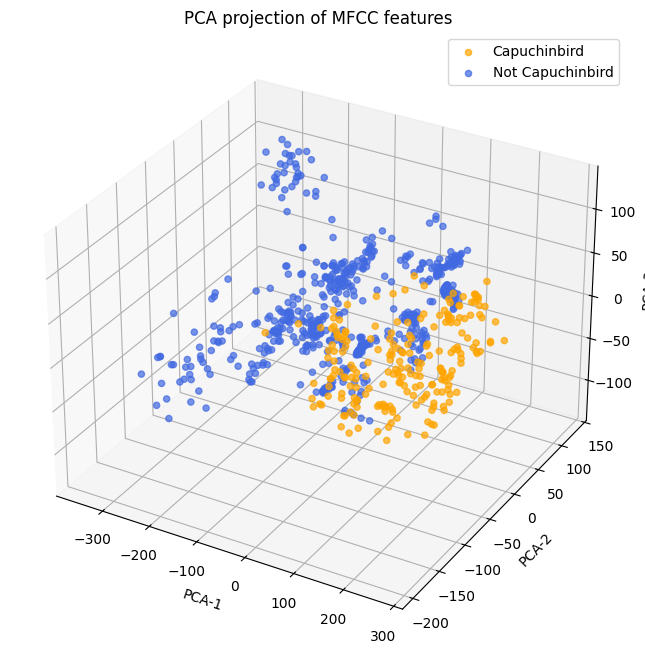

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\manifold\_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap

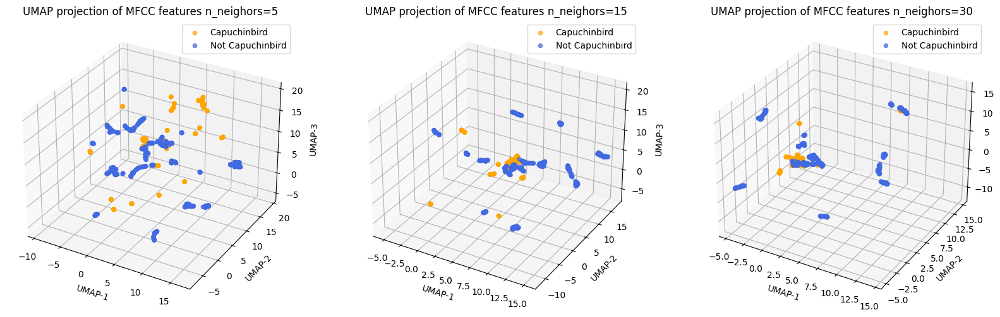

In [33]:
from sklearn.decomposition import PCA
import umap

X = df_features.drop('label', axis=1)
y = df_features['label']

#PCA
PCA_model_3d = PCA(n_components=3, random_state=42)
X_PCA_3d = PCA_model_3d.fit_transform(X)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(projection='3d')
ax.scatter(X_PCA_3d[y == 1, 0], X_PCA_3d[y == 1, 1], X_PCA_3d[y == 1, 2], label='Capuchinbird', alpha=0.7, c='orange')
ax.scatter(X_PCA_3d[y == 0, 0], X_PCA_3d[y == 0, 1], X_PCA_3d[y == 0, 2], label='Not Capuchinbird', alpha=0.7, c='royalblue')
ax.set_title('PCA projection of MFCC features')
ax.set_xlabel('PCA-1')
ax.set_ylabel('PCA-2')
ax.set_zlabel('PCA-3')
plt.legend()
plt.show()

#UMAP
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 15), subplot_kw={'projection':'3d'})

for idx, n_neighbors in enumerate([5, 15, 30]):
    UMAP_model_3d = umap.UMAP(n_components=3, n_neighbors=n_neighbors, random_state=42)
    X_UMAP_3d = UMAP_model_3d.fit_transform(X)

    axes[idx].scatter(X_UMAP_3d[y == 1, 0], X_UMAP_3d[y == 1, 1], X_UMAP_3d[y == 1, 2], label='Capuchinbird', alpha=0.7, c='orange')
    axes[idx].scatter(X_UMAP_3d[y == 0, 0], X_UMAP_3d[y == 0, 1], X_UMAP_3d[y == 0, 2], label='Not Capuchinbird', alpha=0.7, c='royalblue')
    axes[idx].set_title(f'UMAP projection of MFCC features n_neighors={n_neighbors}')
    axes[idx].set_xlabel('UMAP-1')
    axes[idx].set_ylabel('UMAP-2')
    axes[idx].set_zlabel('UMAP-3')
    axes[idx].legend()
plt.show()

## 11.2 Checking Above Dimensionality Reductions Methods on Basic Models

In [34]:
def reduce_dim(X_train, X_test, method):
    X_train_red = method.fit_transform(X_train)
    X_test_red = method.transform(X_test)

    return X_train_red, X_test_red

#### PCA

In [35]:
def check_basic_models_pca(data_frame, feature_names, pca_n_components):
    print(f'Testing models on pca_n_components {pca_n_components}')
    X_train, X_test, y_train, y_test = split_data(data_frame, feature_names)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    pca_model = PCA(n_components=pca_n_components)
    X_train_red, X_test_red = reduce_dim(X_train_scaled, X_test_scaled, pca_model)

    # SVM
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train_red, y_train)
    y_preds = svm.predict(X_test_red)

    svm_report = classification_report(y_test, y_preds, output_dict=True)

    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train_red, y_train)
    y_preds = rf.predict(X_test_red)

    rf_report = classification_report(y_test, y_preds, output_dict=True)

    # LogisticRegression
    lr = LogisticRegression(max_iter=1000, random_state=42)
    lr.fit(X_train_red, y_train)
    y_preds = lr.predict(X_test_red)

    lr_report = classification_report(y_test, y_preds, output_dict=True)

    # Reports
    svm_report = pd.DataFrame(svm_report)
    rf_report = pd.DataFrame(rf_report)
    lr_report = pd.DataFrame(lr_report)

    svm_report['model'] = 'SVM'
    rf_report['model'] = 'RF'
    lr_report['model'] = 'LR'
    svm_report['n_comp'] = pca_n_components
    rf_report['n_comp'] = pca_n_components
    lr_report['n_comp'] = pca_n_components

    all_results = pd.concat((svm_report, rf_report, lr_report))
    all_results = all_results.set_index(['model', 'n_comp'], append=True).reorder_levels(['model', 'n_comp', 0])
    
    return all_results

In [36]:
pca_5_results = check_basic_models_pca(df_features, df_features.columns, pca_n_components=5)
pca_10_results = check_basic_models_pca(df_features, df_features.columns, pca_n_components=10)
pca_15_results = check_basic_models_pca(df_features, df_features.columns, pca_n_components=15)
pca_20_results = check_basic_models_pca(df_features, df_features.columns, pca_n_components=20)

pca_all_results = pd.concat((pca_5_results, pca_10_results, pca_15_results, pca_20_results))
pca_all_results.index = pca_all_results.index.set_names(['model', 'n_comp', 'metric'])
pca_all_results = pca_all_results.reorder_levels(['model', 'n_comp', 'metric']).sort_index(level=['model', 'n_comp'])

pca_all_results

Testing models on pca_n_components 5
Testing models on pca_n_components 10
Testing models on pca_n_components 15
Testing models on pca_n_components 20


0          1  accuracy   macro avg  \
model n_comp metric                                                   
LR    5      f1-score     0.954357   0.867470  0.932099    0.910913   
             precision    0.942623   0.900000  0.932099    0.921311   
             recall       0.966387   0.837209  0.932099    0.901798   
             support    119.000000  43.000000  0.932099  162.000000   
      10     f1-score     0.970711   0.917647  0.956790    0.944179   
             precision    0.966667   0.928571  0.956790    0.947619   
             recall       0.974790   0.906977  0.956790    0.940883   
             support    119.000000  43.000000  0.956790  162.000000   
      15     f1-score     0.983333   0.952381  0.975309    0.967857   
             precision    0.975207   0.975610  0.975309    0.975408   
             recall       0.991597   0.930233  0.975309    0.960915   
             support    119.000000  43.000000  0.975309  162.000000   
      20     f1-score     0.987448   0.964706  0.981481    0.976077   
             precision    0.983333   0.976190  0.981481    0.979762   
             recall       0.991597   0.953488  0.981481    0.972543   
             support    119.000000  43.000000  0.981481  162.000000   
RF    5      f1-score     0.970954   0.915663  0.956790    0.943309   
             precision    0.959016   0.950000  0.956790    0.954508   
             recall       0.983193   0.883721  0.956790    0.933457   
             support    119.000000  43.000000  0.956790  162.000000   
      10     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      15     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      20     f1-score     0.991667   0.976190  0.987654    0.983929   
             precision    0.983471   1.000000  0.987654    0.991736   
             recall       1.000000   0.953488  0.987654    0.976744   
             support    119.000000  43.000000  0.987654  162.000000   
SVM   5      f1-score     0.971193   0.913580  0.956790    0.942387   
             precision    0.951613   0.973684  0.956790    0.962649   
             recall       0.991597   0.860465  0.956790    0.926031   
             support    119.000000  43.000000  0.956790  162.000000   
      10     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      15     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
      20     f1-score     1.000000   1.000000  1.000000    1.000000   
             precision    1.000000   1.000000  1.000000    1.000000   
             recall       1.000000   1.000000  1.000000    1.000000   
             support    119.000000  43.000000  1.000000  162.000000   

                        weighted avg  
model n_comp metric                   
LR    5      f1-score       0.931294  
             precision      0.931309  
             recall         0.932099  
             support      162.000000  
      10     f1-score       0.956626  
             precision      0.956555  
             recall         0.956790  
             support      162.000000  
      15     f1-score       0.975118  
             precision      0.975314  
             r

#### UMAP

In [37]:
import umap

def check_basic_models_umap(data_frame, feature_names, umap_n_components):
    print(f'Testing models on umap_n_components {umap_n_components}')
    X_train, X_test, y_train, y_test = split_data(data_frame, feature_names)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    umap_model = umap.UMAP(n_components=umap_n_components)
    X_train_red = umap_model.fit_transform(X_train_scaled)
    X_test_red = umap_model.transform(X_test_scaled)

    # SVM
    svm = SVC(kernel='rbf', random_state=42)
    svm.fit(X_train_red, y_train)
    y_preds = svm.predict(X_test_red)

    svm_report = classification_report(y_test, y_preds, output_dict=True)

    # Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train_red, y_train)
    y_preds = rf.predict(X_test_red)

    rf_report = classification_report(y_test, y_preds, output_dict=True)

    # LogisticRegression
    lr = LogisticRegression(max_iter=1000, random_state=42)
    lr.fit(X_train_red, y_train)
    y_preds = lr.predict(X_test_red)

    lr_report = classification_report(y_test, y_preds, output_dict=True)

    # Reports
    svm_report = pd.DataFrame(svm_report)
    rf_report = pd.DataFrame(rf_report)
    lr_report = pd.DataFrame(lr_report)

    svm_report['model'] = 'SVM'
    rf_report['model'] = 'RF'
    lr_report['model'] = 'LR'
    svm_report['n_comp'] = umap_n_components
    rf_report['n_comp'] = umap_n_components
    lr_report['n_comp'] = umap_n_components

    all_results = pd.concat((svm_report, rf_report, lr_report))
    all_results = all_results.set_index(['model', 'n_comp'], append=True).reorder_levels(['model', 'n_comp', 0])
    
    return all_results

In [38]:
results_5_components = check_basic_models_umap(df_features, df_features.columns, umap_n_components=5)
results_10_components = check_basic_models_umap(df_features, df_features.columns, umap_n_components=10)
results_15_components = check_basic_models_umap(df_features, df_features.columns, umap_n_components=15)
results_20_components = check_basic_models_umap(df_features, df_features.columns, umap_n_components=20)

all_umap_results = pd.concat((results_5_components, results_10_components, results_15_components, results_20_components))
all_umap_results.index = all_umap_results.index.set_names(['model', 'n_comp', 'metric'])
all_umap_results = all_umap_results.reorder_levels(['model', 'n_comp', 'metric']).sort_index(level=['model', 'n_comp'])

all_umap_results

Testing models on umap_n_components 5


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 10


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 15


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Testing models on umap_n_components 20


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


0          1  accuracy   macro avg  \
model n_comp metric                                                   
LR    5      f1-score     0.944681   0.853933  0.919753    0.899307   
             precision    0.956897   0.826087  0.919753    0.891492   
             recall       0.932773   0.883721  0.919753    0.908247   
             support    119.000000  43.000000  0.919753  162.000000   
      10     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      15     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      20     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
RF    5      f1-score     0.991667   0.976190  0.987654    0.983929   
             precision    0.983471   1.000000  0.987654    0.991736   
             recall       1.000000   0.953488  0.987654    0.976744   
             support    119.000000  43.000000  0.987654  162.000000   
      10     f1-score     0.991667   0.976190  0.987654    0.983929   
             precision    0.983471   1.000000  0.987654    0.991736   
             recall       1.000000   0.953488  0.987654    0.976744   
             support    119.000000  43.000000  0.987654  162.000000   
      15     f1-score     0.991667   0.976190  0.987654    0.983929   
             precision    0.983471   1.000000  0.987654    0.991736   
             recall       1.000000   0.953488  0.987654    0.976744   
             support    119.000000  43.000000  0.987654  162.000000   
      20     f1-score     0.987552   0.963855  0.981481    0.975704   
             precision    0.975410   1.000000  0.981481    0.987705   
             recall       1.000000   0.930233  0.981481    0.965116   
             support    119.000000  43.000000  0.981481  162.000000   
SVM   5      f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      10     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   
      15     f1-score     0.971429   0.911392  0.956790    0.941410   
             precision    0.944444   1.000000  0.956790    0.972222   
             recall       1.000000   0.837209  0.956790    0.918605   
             support    119.000000  43.000000  0.956790  162.000000   
      20     f1-score     0.975410   0.925000  0.962963    0.950205   
             precision    0.952000   1.000000  0.962963    0.976000   
             recall       1.000000   0.860465  0.962963    0.930233   
             support    119.000000  43.000000  0.962963  162.000000   

                        weighted avg  
model n_comp metric                   
LR    5      f1-score       0.920593  
             precision      0.922175  
             recall         0.919753  
             support      162.000000  
      10     f1-score       0.962029  
             precision      0.964741  
             recall         0.962963  
             support      162.000000  
      15     f1-score       0.962029  
             precision      0.964741  
             r

# 12 Testing Various Models

## 12.1 Models

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

clf_models = { 
    'LogisticRegression': LogisticRegression(max_iter=10000, random_state=42), 
    'SVC': SVC(random_state=42), 
    'KNN': KNeighborsClassifier(), 
    'DecisionTree': DecisionTreeClassifier(random_state=42), 
    'RandomForest': RandomForestClassifier(random_state=42), 
    'GradientBoosting': GradientBoostingClassifier(random_state=42) 
} 

## 12.2 Model's hiperparams

In [40]:
from scipy.stats import randint, loguniform, uniform

model_params = {

        'LogisticRegression': {
            'classifier__C': uniform(0.1, 12.0),
            'classifier__penalty': ['l2', None],
            'pca__n_components': randint(3, 25)
    },

        'SVC': {
            'classifier__C': uniform(0.1, 12.0),
            'classifier__kernel': ['linear', 'rbf', 'sigmoid'],
            'classifier__gamma': ['scale', 'auto'],
            'pca__n_components': randint(3, 25)
    },

        'KNN': {
            'classifier__n_neighbors': [3, 5, 7, 9, 11, 15],
            'classifier__weights': ['uniform', 'distance'],
            'classifier__p': [1, 2],
            'pca__n_components': randint(3, 25)
    },

        'DecisionTree': {
            'classifier__splitter': ['best', 'random'],
            'classifier__min_samples_leaf': randint(1, 8),
            'classifier__max_features': ['sqrt', 'log2'],
            'classifier__max_depth': randint(3, 20),
            'pca__n_components': randint(3, 25)
    },

        'RandomForest': {
            'classifier__n_estimators': randint(50, 200),
            'classifier__max_depth': randint(5, 15),
            'classifier__min_samples_split': randint(2, 8),
            'classifier__min_samples_leaf': randint(1, 5),
            'classifier__max_leaf_nodes': [None, 10, 20, 30],
            'classifier__max_features': ['sqrt', 'log2', None],
            'pca__n_components': randint(3, 25)
    },

        'GradientBoosting': {
            'classifier__learning_rate': loguniform(0.1, 1.0),
            'classifier__n_estimators': randint(50, 300),
            'classifier__min_samples_split': randint(2, 8),
            'classifier__min_samples_leaf': randint(1, 5),
            'classifier__max_features': ['sqrt', 'log2', None],
            'pca__n_components': randint(3, 25)
    }
}

## 12.3 Extracting Mean and Std from MFCC Coefficents (Class)

In [41]:
from sklearn.base import BaseEstimator, TransformerMixin
from dataclasses import dataclass

@dataclass
class AudioMFCCExtractor(BaseEstimator, TransformerMixin):
    n_mfcc: int = 20
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        mfcc_features = []
        for filepath in X['filepath']:
            wav = load_wav_24k_mono(filepath)
            wav = fix_audio_length(wav)
            mfcc = get_MFCC(wav, n_mfcc=self.n_mfcc)
            feature_vector = MFCC_mean_std(mfcc)
            mfcc_features.append(feature_vector)

        return np.array(mfcc_features)

## 12.4 Training and Eavaluating Models with PCA

In [42]:
from sklearn.metrics import make_scorer, f1_score, precision_score, recall_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import Pipeline

X = data.drop('label', axis=1)
y = data['label']

X_train, X_test, y_train, y_test = train_test_split(X, y)

scoring = {
    'f1_weighted': make_scorer(f1_score, average='weighted'),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'accuracy': 'accuracy'
}

best_models_pca = {}

for model_name, classifier in clf_models.items():
    print('-------------------------------------------------------------------------------------------------------------------------------------------------')
    print(f'{model_name} Start Training')

    clf = Pipeline([
        ('mfcc', AudioMFCCExtractor(n_mfcc=20)),
        ('scaler', StandardScaler()),
        ('pca', PCA(random_state=42)),
        ('classifier', classifier)
    ])
    
    rnd_cv = RandomizedSearchCV(clf, param_distributions=model_params[model_name], 
                                n_iter=10, scoring=scoring, refit='f1_weighted', cv=10, 
                                n_jobs=-1, random_state=42)
    
    rnd_cv.fit(X_train, y_train)

    best_models_pca[model_name] = {
        'best_estimator': rnd_cv.best_estimator_,
        'best_params': rnd_cv.best_params_,
        'best_scores': {
            key: values[rnd_cv.best_index_] 
            for key, values in rnd_cv.cv_results_.items()
        }
    }

    print("Model's Results")
    print(best_models_pca[model_name]['best_scores'])

-------------------------------------------------------------------------------------------------------------------------------------------------
LogisticRegression Start Training
Model's Results
{'mean_fit_time': np.float64(17.471021604537963), 'std_fit_time': np.float64(1.415256799775944), 'mean_score_time': np.float64(1.6947452545166015), 'std_score_time': np.float64(0.11493123741936126), 'param_classifier__C': np.float64(4.5944814261683495), 'param_classifier__penalty': 'l2', 'param_pca__n_components': np.int64(17), 'params': {'classifier__C': np.float64(4.5944814261683495), 'classifier__penalty': 'l2', 'pca__n_components': 17}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(1.0), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(1.0), 'split4_test_f1_weighted': np.float64(1.0), 'split5_test_f1_weighted': np.float64(0.9834502698750258), 'split6_test_f1_weighted': np.float64(0.9834502698750258), 'split7_test_f1_weigh

In [43]:
model_names = best_models_pca.keys()

df_model_pca_results = pd.DataFrame(
    {'model': model_name, **best_models_pca[model_name]['best_scores']}
    for model_name in model_names
)

df_model_pca_results = (
    df_model_pca_results
    .dropna(axis=1)
    .drop(['params', 'rank_test_f1_weighted', 'rank_test_precision', 'rank_test_recall', 'rank_test_accuracy'], axis=1)
    .set_index('model')
)

df_model_pca_scoring = df_model_pca_results.loc[:, [col for col in df_model_pca_results.columns if col.startswith(('std', 'mean')) and not col.endswith('time')]]
df_model_pca_time_res = df_model_pca_results.loc[:, [col for col in df_model_pca_results.columns if col.startswith('param') or col.endswith('time')]]
df_model_pca_n_iter_res = df_model_pca_results.loc[:, [col for col in df_model_pca_results.columns if col.startswith('split')]]


### Score Results

In [44]:
df_model_pca_scoring

,mean_test_f1_weighted,std_test_f1_weighted,mean_test_precision,std_test_precision,mean_test_recall,std_test_recall,mean_test_accuracy,std_test_accuracy
model,,,,,,,,
LogisticRegression,0.993290,0.011195,1.000000,0.000000,0.976471,0.039019,0.993388,0.011006
SVC,0.998375,0.004876,0.994444,0.016667,1.000000,0.000000,0.998361,0.004918
KNN,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000
DecisionTree,0.940616,0.023096,0.904509,0.073614,0.886765,0.055727,0.940656,0.023779
RandomForest,0.984979,0.011703,1.000000,0.000000,0.946691,0.041244,0.985191,0.011484
GradientBoosting,0.994977,0.007674,1.000000,0.000000,0.981618,0.028096,0.995027,0.007596


### Time Results

In [45]:
df_model_pca_time_res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_pca__n_components
model,,,,,
LogisticRegression,17.471022,1.415257,1.694745,0.114931,17
SVC,10.672500,0.072150,1.201903,0.021704,23
KNN,10.607856,0.100776,1.328032,0.070005,23
DecisionTree,10.771989,0.063961,1.208700,0.024087,21
RandomForest,10.654887,0.102310,1.150330,0.070522,17
GradientBoosting,9.258719,1.745724,0.935882,0.242879,22


### Results in each Iteraion

In [46]:
df_model_pca_n_iter_res

,split0_test_f1_weighted,split1_test_f1_weighted,split2_test_f1_weighted,split3_test_f1_weighted,split4_test_f1_weighted,split5_test_f1_weighted,split6_test_f1_weighted,split7_test_f1_weighted,split8_test_f1_weighted,split9_test_f1_weighted,...,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,split5_test_accuracy,split6_test_accuracy,split7_test_accuracy,split8_test_accuracy,split9_test_accuracy
model,,,,,,,,,,,,,,,,,,,,,
LogisticRegression,1.000000,1.000000,1.000000,1.000000,1.000000,0.98345,0.983450,1.000000,1.000000,0.966004,...,1.00000,1.000000,1.000000,1.000000,1.000000,0.983607,0.983607,1.000000,1.000000,0.966667
SVC,1.000000,1.000000,0.983747,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,...,1.00000,1.000000,0.983607,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
KNN,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,...,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
DecisionTree,0.949251,0.917251,0.967213,0.934426,0.933106,0.95124,0.950351,0.886275,0.965926,0.951123,...,0.95082,0.918033,0.967213,0.934426,0.934426,0.950820,0.950820,0.883333,0.966667,0.950000
RandomForest,1.000000,0.966553,1.000000,0.966553,0.983450,0.98345,0.983450,1.000000,0.983158,0.983177,...,1.00000,0.967213,1.000000,0.967213,0.983607,0.983607,0.983607,1.000000,0.983333,0.983333
GradientBoosting,1.000000,1.000000,1.000000,1.000000,1.000000,0.98345,1.000000,0.983158,0.983158,1.000000,...,1.00000,1.000000,1.000000,1.000000,1.000000,0.983607,1.000000,0.983333,0.983333,1.000000


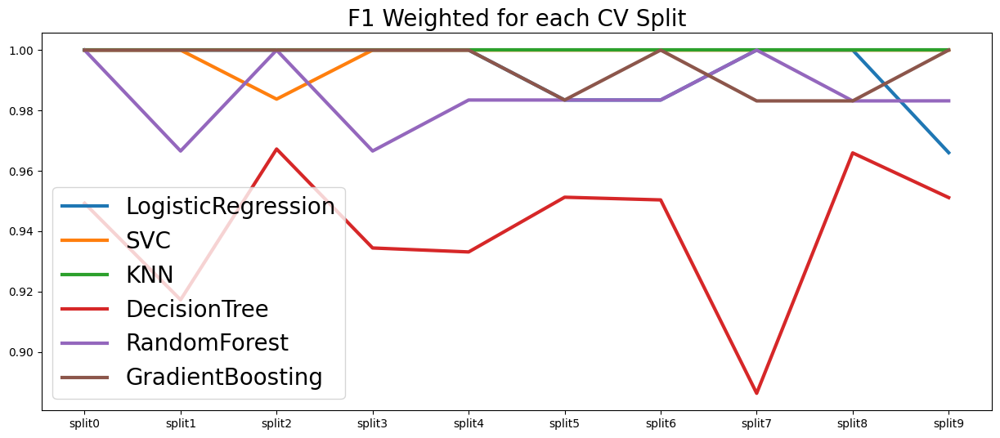

In [47]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_pca_n_iter_res.loc[:, [col for col in df_model_pca_n_iter_res.columns if 'f1' in col]].T, 
    label=df_model_pca_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_pca_n_iter_res.columns if 'f1' in col]
plt.title('F1 Weighted for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

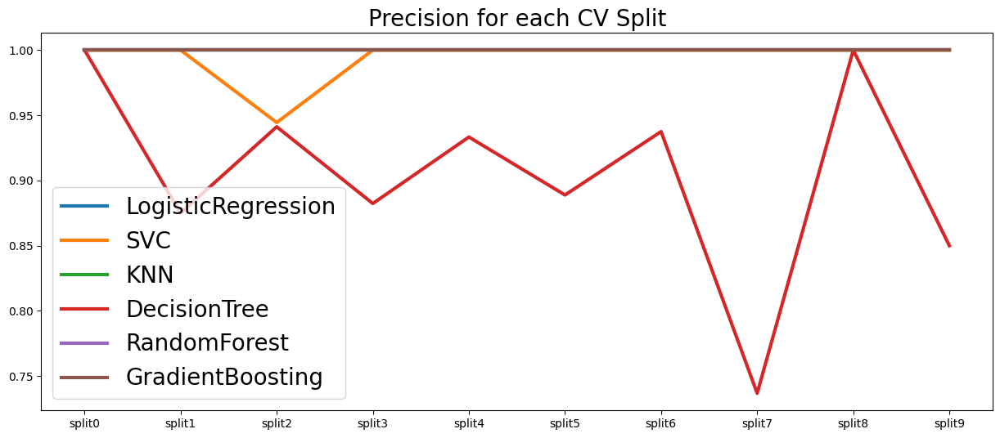

In [48]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_pca_n_iter_res.loc[:, [col for col in df_model_pca_n_iter_res.columns if 'precision' in col]].T, 
    label=df_model_pca_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_pca_n_iter_res.columns if 'precision' in col]
plt.title('Precision for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

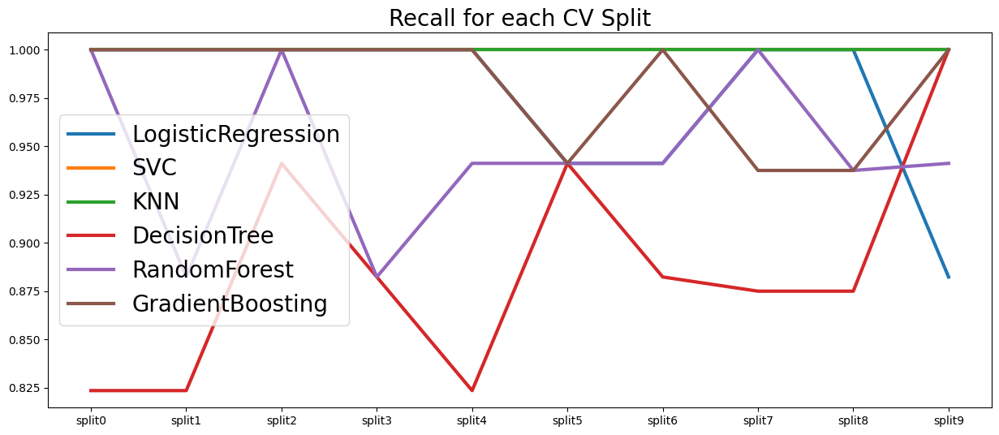

In [49]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_pca_n_iter_res.loc[:, [col for col in df_model_pca_n_iter_res.columns if 'recall' in col]].T, 
    label=df_model_pca_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_pca_n_iter_res.columns if 'recall' in col]
plt.title('Recall for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

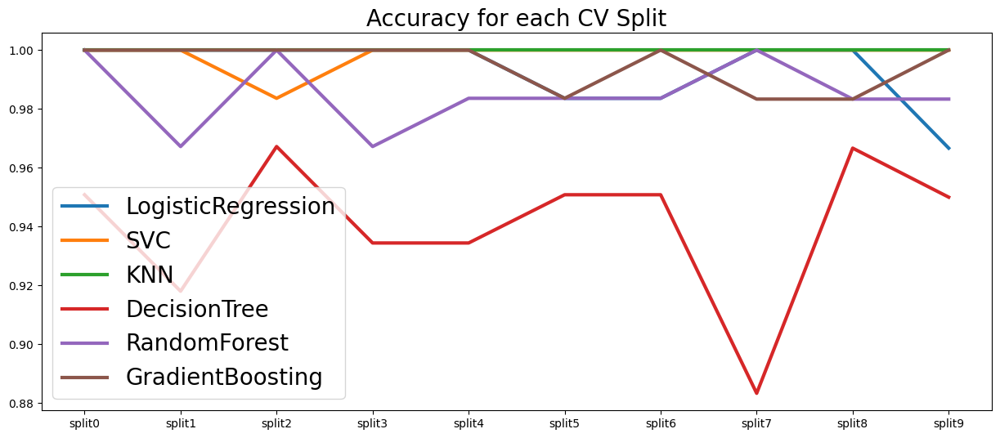

In [50]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_pca_n_iter_res.loc[:, [col for col in df_model_pca_n_iter_res.columns if 'accuracy' in col]].T, 
    label=df_model_pca_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_pca_n_iter_res.columns if 'accuracy' in col]
plt.title('Accuracy for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

## 12.5 Training and Eavaluating Models with UMAP

In [51]:
from scipy.stats import randint, loguniform, uniform

model_params = {

        'LogisticRegression': {
            'classifier__C': uniform(0.1, 12.0),
            'classifier__penalty': ['l2', None],
            'umap__n_components': randint(3, 25)
    },

        'SVC': {
            'classifier__C': uniform(0.1, 12.0),
            'classifier__kernel': ['linear', 'rbf', 'sigmoid'],
            'classifier__gamma': ['scale', 'auto'],
            'umap__n_components': randint(3, 25)
    },

        'KNN': {
            'classifier__n_neighbors': [3, 5, 7, 9, 11, 15],
            'classifier__weights': ['uniform', 'distance'],
            'classifier__p': [1, 2],
            'umap__n_components': randint(3, 25)
    },

        'DecisionTree': {
            'classifier__splitter': ['best', 'random'],
            'classifier__min_samples_leaf': randint(1, 8),
            'classifier__max_features': ['sqrt', 'log2'],
            'classifier__max_depth': randint(3, 20),
            'umap__n_components': randint(3, 25)
    },

        'RandomForest': {
            'classifier__n_estimators': randint(50, 200),
            'classifier__max_depth': randint(5, 15),
            'classifier__min_samples_split': randint(2, 8),
            'classifier__min_samples_leaf': randint(1, 5),
            'classifier__max_leaf_nodes': [None, 10, 20, 30],
            'classifier__max_features': ['sqrt', 'log2', None],
            'umap__n_components': randint(3, 25)
    },

        'GradientBoosting': {
            'classifier__learning_rate': loguniform(0.1, 1.0),
            'classifier__n_estimators': randint(50, 300),
            'classifier__min_samples_split': randint(2, 8),
            'classifier__min_samples_leaf': randint(1, 5),
            'classifier__max_features': ['sqrt', 'log2', None],
            'umap__n_components': randint(3, 25)
    }
}

In [52]:
best_models_umap = {}

for model_name, classifier in clf_models.items():
    print('-------------------------------------------------------------------------------------------------------------------------------------------------')
    print(f'{model_name} Start Training')

    clf = Pipeline([
        ('mfcc', AudioMFCCExtractor(n_mfcc=20)),
        ('scaler', StandardScaler()),
        ('umap', umap.UMAP(random_state=42)),
        ('classifier', classifier)
    ])
    
    rnd_cv = RandomizedSearchCV(clf, param_distributions=model_params[model_name], 
                                n_iter=10, scoring=scoring, refit='f1_weighted', cv=10, 
                                n_jobs=-1, random_state=42)
    
    rnd_cv.fit(X_train, y_train)

    best_models_umap[model_name] = {
        'best_estimator': rnd_cv.best_estimator_,
        'best_params': rnd_cv.best_params_,
        'best_scores': {
            key: values[rnd_cv.best_index_] 
            for key, values in rnd_cv.cv_results_.items()
        }
    }

    print("Model's Results")
    print(best_models_umap[model_name]['best_scores'])

-------------------------------------------------------------------------------------------------------------------------------------------------
LogisticRegression Start Training


c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(24.762204432487486), 'std_fit_time': np.float64(6.088944181355375), 'mean_score_time': np.float64(6.073121857643128), 'std_score_time': np.float64(2.5557261703419787), 'param_classifier__C': np.float64(4.5944814261683495), 'param_classifier__penalty': 'l2', 'param_umap__n_components': np.int64(17), 'params': {'classifier__C': np.float64(4.5944814261683495), 'classifier__penalty': 'l2', 'umap__n_components': 17}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_weighted': np.float64(1.0), 'split5_test_f1_weighted': np.float64(0.9665528233151184), 'split6_test_f1_weighted': np.float64(1.0), 'split7_test_f1_weighted': np.float64(0.9831581490878337), 'split8_test_f1_weighted': np.float64(0.9831581490878337), 'split9_test_f1_weighted': np.float64(0.9484233417905038), 'mean_tes

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(12.316740894317627), 'std_fit_time': np.float64(0.10474188912232406), 'mean_score_time': np.float64(1.1291013479232788), 'std_score_time': np.float64(0.08146584768822131), 'param_classifier__C': np.float64(1.2996989898160347), 'param_classifier__gamma': 'scale', 'param_classifier__kernel': 'linear', 'param_umap__n_components': np.int64(6), 'params': {'classifier__C': np.float64(1.2996989898160347), 'classifier__gamma': 'scale', 'classifier__kernel': 'linear', 'umap__n_components': 6}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_weighted': np.float64(1.0), 'split5_test_f1_weighted': np.float64(0.9665528233151184), 'split6_test_f1_weighted': np.float64(1.0), 'split7_test_f1_weighted': np.float64(0.9831581490878337), 'split8_test_f1_weighted': np.float64(0.9831581490878

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(12.885174655914307), 'std_fit_time': np.float64(0.17070204728328794), 'mean_score_time': np.float64(1.248941922187805), 'std_score_time': np.float64(0.05021360095144865), 'param_classifier__n_neighbors': np.int64(9), 'param_classifier__p': np.int64(1), 'param_classifier__weights': 'uniform', 'param_umap__n_components': np.int64(13), 'params': {'classifier__n_neighbors': 9, 'classifier__p': 1, 'classifier__weights': 'uniform', 'umap__n_components': 13}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_weighted': np.float64(1.0), 'split5_test_f1_weighted': np.float64(0.9665528233151184), 'split6_test_f1_weighted': np.float64(1.0), 'split7_test_f1_weighted': np.float64(0.9831581490878337), 'split8_test_f1_weighted': np.float64(0.9831581490878337), 'split9_test_f1_weighted': 

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(10.704129528999328), 'std_fit_time': np.float64(1.758225192272169), 'mean_score_time': np.float64(0.9744879722595214), 'std_score_time': np.float64(0.29288237674473055), 'param_classifier__max_depth': np.int64(7), 'param_classifier__max_features': 'sqrt', 'param_classifier__min_samples_leaf': np.int64(7), 'param_classifier__splitter': 'best', 'param_umap__n_components': np.int64(11), 'params': {'classifier__max_depth': 7, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 7, 'classifier__splitter': 'best', 'umap__n_components': 11}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_weighted': np.float64(0.9837465342270316), 'split5_test_f1_weighted': np.float64(0.9665528233151184), 'split6_test_f1_weighted': np.float64(1.0), 'split7_test_f1_weighted': np.f

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(12.626084876060485), 'std_fit_time': np.float64(0.13054452526656948), 'mean_score_time': np.float64(1.2228062868118286), 'std_score_time': np.float64(0.12413009929030887), 'param_classifier__max_depth': np.int64(11), 'param_classifier__max_features': 'sqrt', 'param_classifier__max_leaf_nodes': 20, 'param_classifier__min_samples_leaf': np.int64(3), 'param_classifier__min_samples_split': np.int64(6), 'param_classifier__n_estimators': np.int64(70), 'param_umap__n_components': np.int64(9), 'params': {'classifier__max_depth': 11, 'classifier__max_features': 'sqrt', 'classifier__max_leaf_nodes': 20, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 6, 'classifier__n_estimators': 70, 'umap__n_components': 9}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_wei

c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\miki0\Desktop\Projects\Audio\CapuchinCallDetect\myenv\lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Model's Results
{'mean_fit_time': np.float64(13.331349658966065), 'std_fit_time': np.float64(0.07722689127738873), 'mean_score_time': np.float64(1.3284595251083373), 'std_score_time': np.float64(0.07294979279467384), 'param_classifier__learning_rate': np.float64(0.23688639503640782), 'param_classifier__max_features': 'sqrt', 'param_classifier__min_samples_leaf': np.int64(3), 'param_classifier__min_samples_split': np.int64(4), 'param_classifier__n_estimators': np.int64(121), 'param_umap__n_components': np.int64(23), 'params': {'classifier__learning_rate': np.float64(0.23688639503640782), 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 4, 'classifier__n_estimators': 121, 'umap__n_components': 23}, 'split0_test_f1_weighted': np.float64(1.0), 'split1_test_f1_weighted': np.float64(0.9665528233151184), 'split2_test_f1_weighted': np.float64(1.0), 'split3_test_f1_weighted': np.float64(0.9665528233151184), 'split4_test_f1_weighted': np.flo

In [53]:
model_names = best_models_pca.keys()

df_model_umap_results = pd.DataFrame(
    {'model': model_name, **best_models_umap[model_name]['best_scores']}
    for model_name in model_names
)

df_model_umap_results = (
    df_model_umap_results
    .dropna(axis=1)
    .drop(['params', 'rank_test_f1_weighted', 'rank_test_precision', 'rank_test_recall', 'rank_test_accuracy'], axis=1)
    .set_index('model')
)

df_model_umap_scoring = df_model_umap_results.loc[:, [col for col in df_model_umap_results.columns if col.startswith(('std', 'mean')) and not col.endswith('time')]]
df_model_umap_time_res = df_model_umap_results.loc[:, [col for col in df_model_umap_results.columns if col.startswith('param') or col.endswith('time')]]
df_model_umap_n_iter_res = df_model_umap_results.loc[:, [col for col in df_model_umap_results.columns if col.startswith('split')]]


### Score Results

In [54]:
df_model_umap_scoring

,mean_test_f1_weighted,std_test_f1_weighted,mean_test_precision,std_test_precision,mean_test_recall,std_test_recall,mean_test_accuracy,std_test_accuracy
model,,,,,,,,
LogisticRegression,0.981440,0.017717,1.000000,0.000000,0.934559,0.061361,0.981831,0.017260
SVC,0.981440,0.017717,1.000000,0.000000,0.934559,0.061361,0.981831,0.017260
KNN,0.981440,0.017717,1.000000,0.000000,0.934559,0.061361,0.981831,0.017260
DecisionTree,0.981573,0.013956,0.994444,0.016667,0.940441,0.052634,0.981858,0.013671
RandomForest,0.981440,0.017717,1.000000,0.000000,0.934559,0.061361,0.981831,0.017260
GradientBoosting,0.981440,0.017717,1.000000,0.000000,0.934559,0.061361,0.981831,0.017260


### Time Results

In [55]:
df_model_umap_time_res

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_umap__n_components
model,,,,,
LogisticRegression,24.762204,6.088944,6.073122,2.555726,17
SVC,12.316741,0.104742,1.129101,0.081466,6
KNN,12.885175,0.170702,1.248942,0.050214,13
DecisionTree,10.704130,1.758225,0.974488,0.292882,11
RandomForest,12.626085,0.130545,1.222806,0.124130,9
GradientBoosting,13.331350,0.077227,1.328460,0.072950,23


### Results for each Iteration

In [56]:
df_model_umap_n_iter_res

,split0_test_f1_weighted,split1_test_f1_weighted,split2_test_f1_weighted,split3_test_f1_weighted,split4_test_f1_weighted,split5_test_f1_weighted,split6_test_f1_weighted,split7_test_f1_weighted,split8_test_f1_weighted,split9_test_f1_weighted,...,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,split4_test_accuracy,split5_test_accuracy,split6_test_accuracy,split7_test_accuracy,split8_test_accuracy,split9_test_accuracy
model,,,,,,,,,,,,,,,,,,,,,
LogisticRegression,1.0,0.966553,1.0,0.966553,1.000000,0.966553,1.0,0.983158,0.983158,0.948423,...,1.0,0.967213,1.0,0.967213,1.000000,0.967213,1.0,0.983333,0.983333,0.950000
SVC,1.0,0.966553,1.0,0.966553,1.000000,0.966553,1.0,0.983158,0.983158,0.948423,...,1.0,0.967213,1.0,0.967213,1.000000,0.967213,1.0,0.983333,0.983333,0.950000
KNN,1.0,0.966553,1.0,0.966553,1.000000,0.966553,1.0,0.983158,0.983158,0.948423,...,1.0,0.967213,1.0,0.967213,1.000000,0.967213,1.0,0.983333,0.983333,0.950000
DecisionTree,1.0,0.966553,1.0,0.966553,0.983747,0.966553,1.0,0.983158,0.983158,0.966004,...,1.0,0.967213,1.0,0.967213,0.983607,0.967213,1.0,0.983333,0.983333,0.966667
RandomForest,1.0,0.966553,1.0,0.966553,1.000000,0.966553,1.0,0.983158,0.983158,0.948423,...,1.0,0.967213,1.0,0.967213,1.000000,0.967213,1.0,0.983333,0.983333,0.950000
GradientBoosting,1.0,0.966553,1.0,0.966553,1.000000,0.966553,1.0,0.983158,0.983158,0.948423,...,1.0,0.967213,1.0,0.967213,1.000000,0.967213,1.0,0.983333,0.983333,0.950000


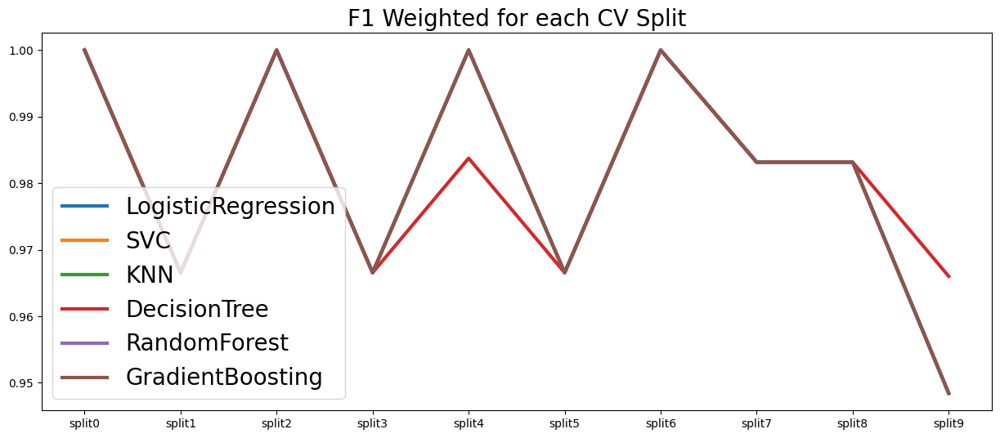

In [57]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_umap_n_iter_res.loc[:, [col for col in df_model_umap_n_iter_res.columns if 'f1' in col]].T, 
    label=df_model_umap_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_umap_n_iter_res.columns if 'f1' in col]
plt.title('F1 Weighted for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

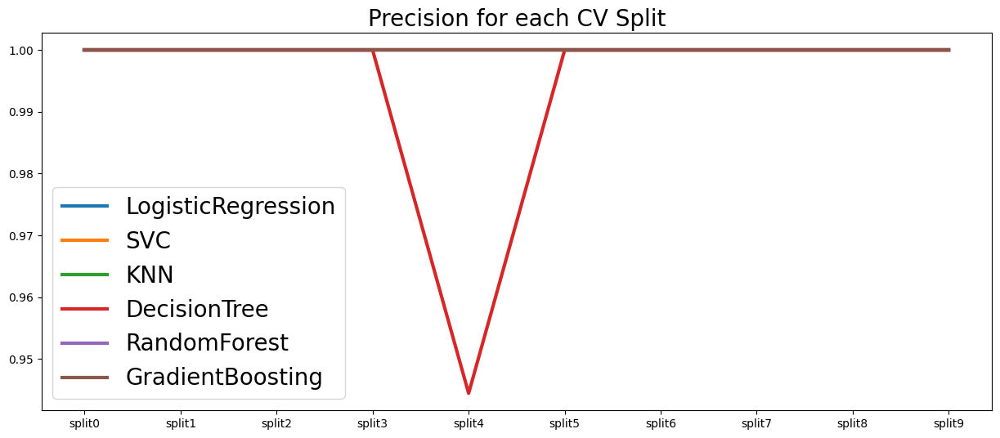

In [58]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_umap_n_iter_res.loc[:, [col for col in df_model_umap_n_iter_res.columns if 'precision' in col]].T, 
    label=df_model_umap_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_umap_n_iter_res.columns if 'precision' in col]
plt.title('Precision for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

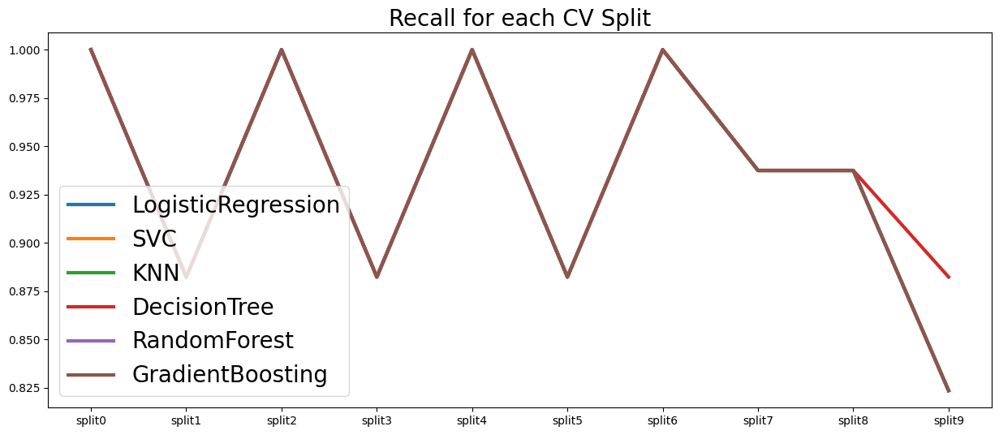

In [59]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_umap_n_iter_res.loc[:, [col for col in df_model_umap_n_iter_res.columns if 'recall' in col]].T, 
    label=df_model_umap_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_umap_n_iter_res.columns if 'recall' in col]
plt.title('Recall for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

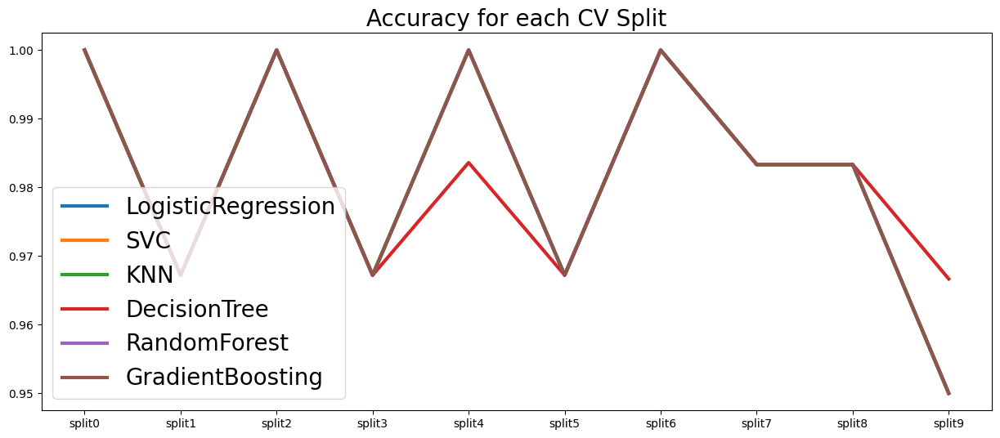

In [60]:
plt.figure(figsize=(15, 6))
plt.plot(
    df_model_umap_n_iter_res.loc[:, [col for col in df_model_umap_n_iter_res.columns if 'accuracy' in col]].T, 
    label=df_model_umap_n_iter_res.index, linewidth=3
)

xticks_labels = [col.split('_')[0] for col in df_model_umap_n_iter_res.columns if 'accuracy' in col]
plt.title('Accuracy for each CV Split', fontsize=20)
plt.xticks(ticks=list(range(len(xticks_labels))), labels=xticks_labels)

plt.legend(fontsize=20)
plt.show()

## 12.6 Evaluating Models with PCA on Test Set

Model: LogisticRegression
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       154
           1       0.96      0.94      0.95        49

    accuracy                           0.98       203
   macro avg       0.97      0.96      0.97       203
weighted avg       0.98      0.98      0.98       203

ROC AUC: 0.9848926583620461


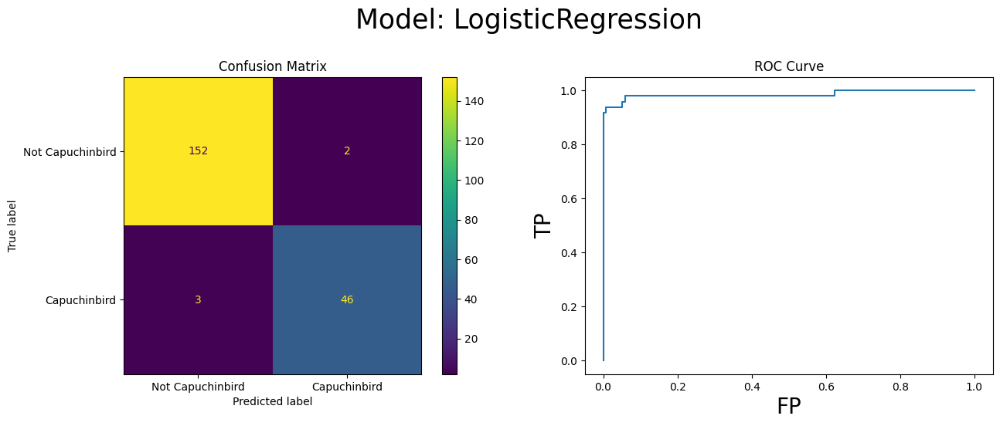

Model: SVC
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       154
           1       1.00      0.98      0.99        49

    accuracy                           1.00       203
   macro avg       1.00      0.99      0.99       203
weighted avg       1.00      1.00      1.00       203



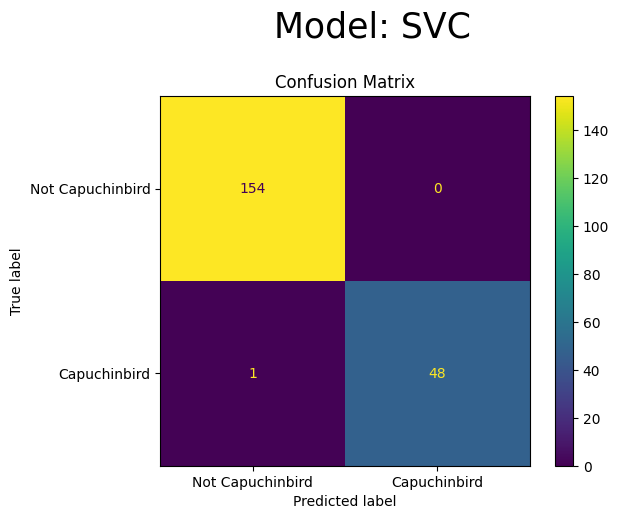

Model: KNN
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       154
           1       1.00      1.00      1.00        49

    accuracy                           1.00       203
   macro avg       1.00      1.00      1.00       203
weighted avg       1.00      1.00      1.00       203

ROC AUC: 1.0


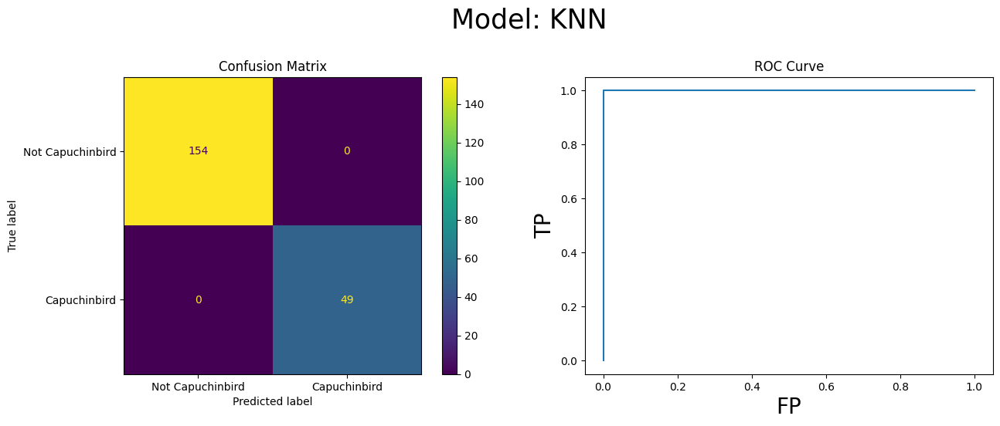

Model: DecisionTree
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       154
           1       0.89      0.86      0.88        49

    accuracy                           0.94       203
   macro avg       0.92      0.91      0.92       203
weighted avg       0.94      0.94      0.94       203

ROC AUC: 0.9318844420885238


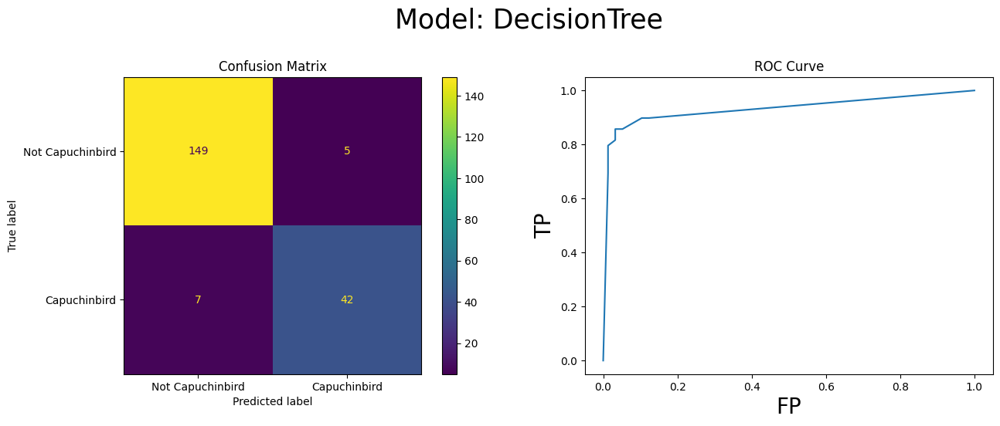

Model: RandomForest
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       154
           1       1.00      0.90      0.95        49

    accuracy                           0.98       203
   macro avg       0.98      0.95      0.97       203
weighted avg       0.98      0.98      0.97       203

ROC AUC: 0.9981447124304267


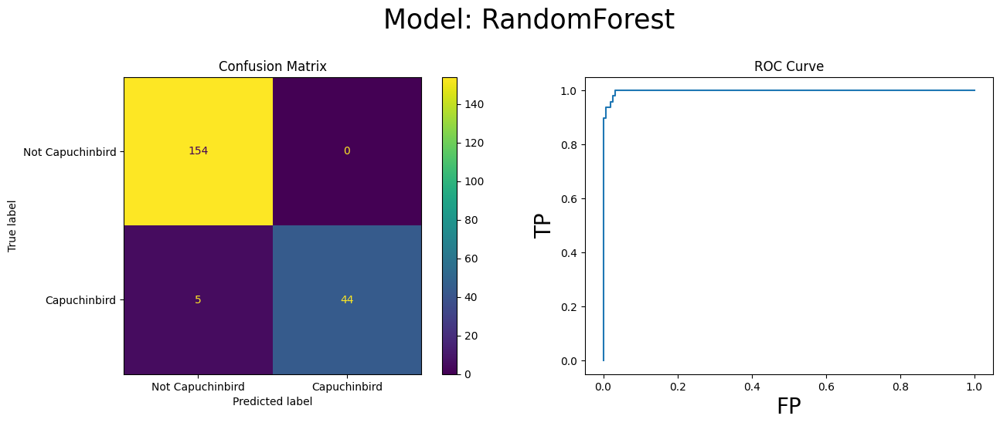

Model: GradientBoosting
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       154
           1       1.00      0.92      0.96        49

    accuracy                           0.98       203
   macro avg       0.99      0.96      0.97       203
weighted avg       0.98      0.98      0.98       203

ROC AUC: 0.9992048767558972


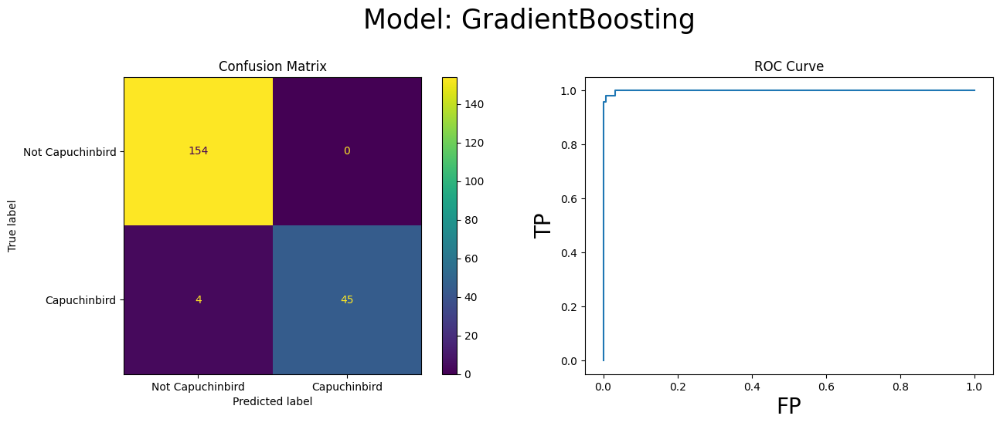

In [62]:
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, ConfusionMatrixDisplay

model_test_results = {}

for model_name, model_results in best_models_pca.items():
    print(f'Model: {model_name}')
    best_model = model_results['best_estimator']
    y_pred = best_model.predict(X_test)

    print('Classification Report:')
    test_report = classification_report(y_test, y_pred)
    print(test_report)

    cm = confusion_matrix(y_test, y_pred)
    cm_disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Capuchinbird', 'Capuchinbird'])

    if hasattr(best_model, 'predict_proba'):
        y_score = best_model.predict_proba(X_test)

        falseposrate, trueposrate, thresholds = roc_curve(y_test, y_score[:, 1])
        auc = roc_auc_score(y_test, y_score[:, 1])
        print(f'ROC AUC: {auc}')

        fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

        cm_disp.plot(ax=axes[0])
        axes[0].set_title('Confusion Matrix')

        axes[1].plot(falseposrate, trueposrate)
        axes[1].set_title('ROC Curve')
        axes[1].set_xlabel('FP', fontsize=20)
        axes[1].set_ylabel('TP', fontsize=20)

        plt.suptitle(f'Model: {model_name}', fontsize=25, y=1.06)
        
    else:
        cm_disp.plot()
        plt.title('Confusion Matrix')
        plt.suptitle(f'Model: {model_name}', fontsize=25, y=1.06)

    plt.show()

# 13 Saving Best Model

In [63]:
import pickle

models_dir = PROJECT_PATH / 'models'
models_dir.mkdir(exist_ok=True, parents=True)

with open(models_dir / 'knn_pca_model.pkl', 'wb') as f:
    pickle.dump(best_models_pca['KNN']['best_estimator'], f)